### Import Lib

In [20]:
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
pio.renderers.default = 'colab'

### Import Data

In [21]:
dataset1 = pd.read_csv('../data/covid.csv')
dataset1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [22]:
dataset2 = pd.read_csv('../data/covid_grouped.csv')
dataset2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


### Get data info

In [23]:
print(f'For Dataset1 the total number of rows are {dataset1.shape[0]} and it have {dataset1.shape[1]} number of columns \nThe Total size is {dataset1.size}\n')

print(f'For Dataset2 the total number of rows are {dataset2.shape[0]} and it have {dataset2.shape[1]} number of columns \nThe Total size is {dataset2.size}')

For Dataset1 the total number of rows are 209 and it have 17 number of columns 
The Total size is 3553

For Dataset2 the total number of rows are 35156 and it have 11 number of columns 
The Total size is 386716


In [24]:
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country/Region    209 non-null    object 
 1   Continent         208 non-null    object 
 2   Population        208 non-null    float64
 3   TotalCases        209 non-null    int64  
 4   NewCases          4 non-null      float64
 5   TotalDeaths       188 non-null    float64
 6   NewDeaths         3 non-null      float64
 7   TotalRecovered    205 non-null    float64
 8   NewRecovered      3 non-null      float64
 9   ActiveCases       205 non-null    float64
 10  Serious,Critical  122 non-null    float64
 11  Tot Cases/1M pop  208 non-null    float64
 12  Deaths/1M pop     187 non-null    float64
 13  TotalTests        191 non-null    float64
 14  Tests/1M pop      191 non-null    float64
 15  WHO Region        184 non-null    object 
 16  iso_alpha         209 non-null    object 
dt

In [25]:
dataset2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35156 entries, 0 to 35155
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            35156 non-null  object
 1   Country/Region  35156 non-null  object
 2   Confirmed       35156 non-null  int64 
 3   Deaths          35156 non-null  int64 
 4   Recovered       35156 non-null  int64 
 5   Active          35156 non-null  int64 
 6   New cases       35156 non-null  int64 
 7   New deaths      35156 non-null  int64 
 8   New recovered   35156 non-null  int64 
 9   WHO Region      35156 non-null  object
 10  iso_alpha       35156 non-null  object
dtypes: int64(7), object(4)
memory usage: 3.0+ MB


### Data Cleaning

In [26]:
dataset1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

As for the columns `NewCases`,`NewDeaths` and `NewRecovered` have null values in it so we are going to drop those columns 

In [27]:
dataset1 = dataset1.drop(['NewCases','NewDeaths','NewRecovered'],axis=1)
dataset1.shape

(209, 14)

### Create Table using Plotly

In [28]:
from plotly.figure_factory import create_table

colorscale = [[0, '#4d004c'], [.5, '#f2e5ff'], [1, '#ffffff']]
table = create_table(dataset1.head(20),colorscale=colorscale)
py.iplot(table)

### Covid infected countries

In [29]:
col = ['TotalCases','TotalDeaths','TotalRecovered','TotalTests']
for i in col:
    fig = px.bar(
    dataset1.head(15),
    x='Country/Region',
    y=i,
    color=i,
    hover_data = ['Continent'],
    text_auto = i,
    title = 'Country/Region Vs ' + i
    )
    fig.update_layout(
    template='plotly_white',
    width=1000,
    xaxis_title='Country',
    yaxis_title=i,
    )
    fig.show()

### Covid Cases in Continents

In [30]:
col = ['TotalCases','TotalDeaths','TotalRecovered','TotalTests']
for i in col:
    fig = px.bar(
        dataset1.head(15),
        x='Continent',
        y=i,
        color = 'Country/Region',
        title = 'Continent Vs '+i
    )
    fig.update_layout(
        template='plotly_white',
        width=1000,
        xaxis_title='Continent',
        yaxis_title=i,
    )
    fig.show()

In [31]:
col = ['TotalCases','TotalDeaths','TotalTests']
for i in col:
    fig = px.scatter(
        dataset1.head(15),
        x='Continent',
        y=i,
        color = i,
        title = 'Continent Vs '+i,
        size=i,
        size_max=80,
        log_y=True
    )
    fig.update_layout(
        template='plotly_white',
        width=1000,
        xaxis_title='Continent',
        yaxis_title=i,
    )
    fig.show()

In [32]:
## Create Mapes

px.choropleth(dataset2,
              locations="iso_alpha",
              color="Country/Region",
              color_continuous_scale="Blues",
              animation_frame="Date"
              )

In [33]:
px.bar(
    dataset2,
    x="WHO Region",
    y="Confirmed",
    color="WHO Region",
    animation_frame="Date",
    hover_name="Country/Region",
)

### Word Cloud

In [34]:
dataset3 = pd.read_csv('../data/coviddeath.csv')
dataset3.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [35]:
dataset3.groupby(["Condition"]).count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


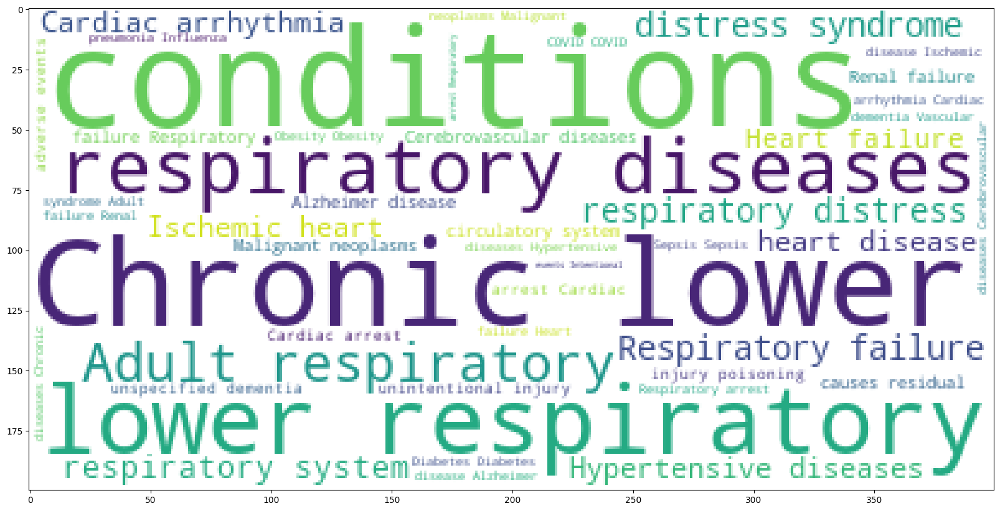

In [36]:
from wordcloud import WordCloud

sentences = dataset3['Condition'].tolist()
sentences_as_string = ' '.join(sentences)

plt.figure(figsize=(20, 20))
plt.imshow(WordCloud(background_color='white').generate(sentences_as_string))